<a href="https://colab.research.google.com/github/popoolaademola/unpackai_dl_101/blob/main/04_NLP_Coursebook_popoola.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 💻Week 4 Workbook of unpackAI ```DL101 Bootcamp```

Congrats on getting through the past week. This week will focus on language and text! The most available and freely accessible data type on the internet.

## 📕 Learning Objectives
* Understand the potentials of NLP applications in real life. 
* Go through an end-to-end process of building a text generator model.
* Play with different kinds of pre-trained NLP model.

## 📅 Weekly Progress 

|Week | Content | Learning Objectives|
|:--- |:--- | :--- |
|0 | Warm Up & Theory | Get to know more about your classmates, the mentors, and learn about the fundamental concepts of Machine Learning, how it works, its limitations, and potential.
|1 |Computer Vision | Dive into Computer Vision, and learn about how machines are able to derive insights and make predictions from visual data. Build your own computer vision application, by gathering your own images and train your own model.**
|2 |Tabular Data | Comprehend how AI & Machine Learning can be applied to Tabular Data such as sales, marketing, or customer data, and learn how to deduce actionable insights for the future, and build your own classification or regression application.
|3 |Recommender Systems | Learn more about Recommender Systems, and understand how TikTok, Youtube, and Netflix are able to recommend your next favorite piece of content. Choose a dataset to build your own model to predict and recommend.
|**4** | **Natural Language Processing (NLP)** | **Apply AI & Machine Learning to text, discover Language Models and go through the process of how an AI model is able to generate, summarize and classify text. Build your own NLP application to automatically generate movie reviews, or analyze sentiment.**
|5 | Practical AI for you & Graduation | Jump into a 1:1 mentorship session with our AI experts to define an AI project that solves a pain point in your organization, personal project, or life in general. Research, gather feedback, write an article and pitch your project to the class. Successfully graduate from the Bootcamp and receive your AI certification.

## 🎸 Libraries & Dependencies needed

In [ ]:
!pip install -Uqq unpackai
!pip install -Uqq transformers==4.10.2
!pip install -q datasets transformers[sentencepiece]

     |████████████████████████████████| 73 kB 2.4 MB/s 
     |████████████████████████████████| 95 kB 4.1 MB/s 
     |████████████████████████████████| 189 kB 35.1 MB/s 
     |████████████████████████████████| 56 kB 5.0 MB/s 
     |████████████████████████████████| 2.8 MB 8.4 MB/s 
     |████████████████████████████████| 3.3 MB 36.2 MB/s 
     |████████████████████████████████| 596 kB 7.9 MB/s 
     |████████████████████████████████| 895 kB 36.7 MB/s 
     |████████████████████████████████| 67 kB 4.8 MB/s 
     |████████████████████████████████| 312 kB 12.6 MB/s 
     |████████████████████████████████| 133 kB 47.5 MB/s 
     |████████████████████████████████| 243 kB 53.0 MB/s 
     |████████████████████████████████| 1.1 MB 51.6 MB/s 
     |████████████████████████████████| 94 kB 1.7 MB/s 
     |████████████████████████████████| 144 kB 52.3 MB/s 
     |████████████████████████████████| 271 kB 50.9 MB/s 
     |████████████████████████████████| 1.1 MB 49.1 MB/s 


In [ ]:
import torch
import numpy as np
from transformers import (
    AutoTokenizer,
    AutoModel,
    pipeline,
    set_seed,
    Trainer,
    TextDataset,
    DataCollatorForLanguageModeling,
    TrainingArguments,
    AutoModelForSequenceClassification,
)
from unpackai.nlp import Textual, InterpEmbeddingsTokenizer
from ipywidgets import interact
import logging
from fastai import *
from collections import Counter

In [ ]:
import graphviz
def gv(s): return graphviz.Source('digraph G{ rankdir="LR"' + s + '; }')

# Introduction to Natural Language Processing (NLP)

## What is Natural Language Proessing in Machine Learning?

Natural Language Processing (NLP) is the interdisciplinary field of computer science and liguistics. NLP is the ability for computers to understand human language.

<img src="https://www.dropbox.com/s/h3p9rj5q7g6v8mr/NLPimage.png?dl=1" alt="nlp" width="300"/>

### Applications in NLP

Below we will show you various examples of how NLP can be applied in practice. Aside from a detailed description of the actual usecase we will also provide you with some simple code cells that you can run **to try it out yourselves**!

*The output after running each cell is very long.*

#### Named Entity Recognition (NER)

Named Entity Recognition (NER) is the task of identifying and categorizing key information (entities) in text. An entity can be any word or series of words that consistently refers to the same thing. Examples could be entities such as person (PER), organization (ORG), date (DATE), location (LOC), or more.

<img src="https://www.dropbox.com/s/ph7piwx984usja1/NamedEntityRecognition.png?dl=1" alt="ner" width="800"/>

*Input*: In the example below, you can see that we provided the model with a sentence as an input to recognise the entities within it.

Let's run it.

In [ ]:
ner = pipeline("ner", grouped_entities=True)

No model was supplied, defaulted to dbmdz/bert-large-cased-finetuned-conll03-english (https://huggingface.co/dbmdz/bert-large-cased-finetuned-conll03-english)


Downloading:   0%|          | 0.00/998 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/60.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/213k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/transformers/pipelines/token_classification.py:155: UserWarning: `grouped_entities` is deprecated and will be removed in version v5.0.0, defaulted to `aggregation_strategy="AggregationStrategy.SIMPLE"` instead.
  f'`grouped_entities` is deprecated and will be removed in version v5.0.0, defaulted to `aggregation_strategy="{aggregation_strategy}"` instead.'


In [ ]:
ner("My name is John and I work at unpackAI in Beijing.")

[{'end': 15,
  'entity_group': 'PER',
  'score': 0.99865335,
  'start': 11,
  'word': 'John'},
 {'end': 38,
  'entity_group': 'ORG',
  'score': 0.7754364,
  'start': 30,
  'word': 'unpackAI'},
 {'end': 49,
  'entity_group': 'LOC',
  'score': 0.99954224,
  'start': 42,
  'word': 'Beijing'}]

*Output:* The model provides the outputs for `end` (ending index of the keyword in the sentence), `entity group` (entity category), `score` (confidence of prediction), `start` (starting index of the keyword in the sentence) and `word` (the keyword that the model categorised).

*Result:* It correctly identified that John is a person (PER), unpackAI an organization (ORG), and Beijing a location (LOC).

Feel free to change the text to your liking. Be prepared that it will identify other entities that you have not seen before.

#### Question Answering

Question Answering is a fundamental challenge in Natural Language Processing (NLP) that involves retrieving information relevant to a given question and using them to extract the correct answer.

<img src="https://www.dropbox.com/s/h7w689slyusnj1k/QuestionAnswering1.png?dl=1" alt="questionanwering" width="300"/>

*Input:* In the example below, you can see that we provided the model with a `question` for a given `context` to extract the answer.

Let's run it!

In [ ]:
question_answerer = pipeline("question-answering")

No model was supplied, defaulted to distilbert-base-cased-distilled-squad (https://huggingface.co/distilbert-base-cased-distilled-squad)


Downloading:   0%|          | 0.00/473 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/261M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/213k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/436k [00:00<?, ?B/s]

In [ ]:
question_answerer(
    question="Where do I work?",
    context="My name is John and I work at unpackAI in Beijing."
)

{'answer': 'unpackAI', 'end': 38, 'score': 0.5068174004554749, 'start': 30}

*Output:* The model provides the outputs for `answer` (answer to the question), `end` (ending index of the keyword in the sentence), `score` (confidence of prediction) and `start` (starting index of the keyword in the sentence).

*Result*: It correctly identified that unpackAI is the answer to the question.

Feel free to change the question and context to your liking. This is a simple example to show you how quickly we can employ NLP techniques. To improve our model we could provide a dataset of text as the context, to be more flexible and specific at answering questions.

*Note that this pipeline works by extracting information from the provided context; it does not generate the answer.*

#### Text Generation

In text generation, we are continously predicting the next word within a given sentence. It resembles how people speak (or, to be more precise, write) based on that the data it was trained on.


<img src="https://www.dropbox.com/s/dm8uvw60w0szlvy/textgeneration.jpg?dl=1" alt="textgeneration" width="500"/>

*Input:* In the example below, you can see that we provided the model with a sentence for it to continously predict the most probable next word. We specified `max_length` (number of words to be generated) and `num_return_sequences` (number of example sequences to be generated).

Let's run it!

In [ ]:
generator = pipeline("text-generation")
generator(
    "In this course, we will teach you how to utilize NLP",
    max_length=30,
    num_return_sequences=2
)

No model was supplied, defaulted to gpt2 (https://huggingface.co/gpt2)


Downloading:   0%|          | 0.00/665 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/548M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Using pad_token, but it is not set yet.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


[{'generated_text': 'In this course, we will teach you how to utilize NLP, the computer vision library you have at your disposal. NLP is one of the'},
 {'generated_text': 'In this course, we will teach you how to utilize NLP, a concept that has been around for about 20 years. Our goal is to use'}]

```
[{'generated_text': "In this course, we will teach you how to utilize NLP in a way not present in current knowledge about the neurobiological mechanisms underlying Parkinson's"},
 {'generated_text': 'In this course, we will teach you how to utilize NLP with your music. Using NLP and its application in your own music, you can'}]
```

*Output:* The model provides the ouputs for `generated_text` (generated text based on the input).

*Result:* It successfully generated two sequences of text based on our initial entry.

As the model includes some randomness, the result will always be different. The function above is very similar to how Google predicts the next word in your search query, just that we utilize it to generate text.

#### Summarization

Summarization is the task of reducing a text into a shorter text while keeping all (or most) of the important aspects referenced in the text.

*Input:* In the example below, you can see that we provided the model with a longer text related to COVID-19. We specified `max_length` (number of words to be generated) and `num_return_sequences` (number of example sequences to be generated).

Let's run it.

In [ ]:
summarizer = pipeline("summarization")

No model was supplied, defaulted to sshleifer/distilbart-cnn-12-6 (https://huggingface.co/sshleifer/distilbart-cnn-12-6)


Downloading:   0%|          | 0.00/1.80k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/899k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

In [ ]:
summarizer("""
COVID-19 is caused by a coronavirus called SARS-CoV-2. 
Older adults and people who have severe underlying medical conditions like heart or lung disease or diabetes seem to be at higher risk for developing more serious complications from COVID-19 illness.
It is thought to spread mainly from person to person, mainly through respiratory droplets produced when an infected person coughs or sneezes. 
These droplets can land in the mouths or noses of people who are nearby or possibly be inhaled into the lungs. 
Spread is more likely when people are in close contact with one another (within about 6 feet). 
It may be possible that a person can get COVID-19 by touching a surface or object that has the virus on it and then touching their own mouth, nose, or possibly their eyes. 
This is not thought to be the main way the virus spreads, but we are still learning more about this virus.
The virus that causes COVID-19 is spreading very easily and sustainably between people. 
Information from the ongoing COVID-19 pandemic suggests that this virus is spreading more efficiently than influenza, but not as efficiently as measles, which is highly contagious.""",
    max_length=100,
    num_return_sequences=1
    )

[{'summary_text': ' COVID-19 is caused by a coronavirus called SARS-CoV-2 . It is thought to spread mainly from person to person, mainly through respiratory droplets produced when an infected person coughs or sneezes . These droplets can land in the mouths or noses of people nearby or possibly be inhaled into the lungs .'}]

*Output:* The model provides the output for `summary_text` (generated summary based on the input).

*Result:* It successfully generated the summary while considering our input arguments  `max_length` and `num_return_sequences`.

Feel free to apply it to texts that you have written or found somewhere and change the input arguments (including length of summary).

#### Translation

Machine Translation (MT) is the task of automatically converting one natural language into another, preserving the meaning of the input text, and producing fluent text in the output language. 

<img src="https://www.dropbox.com/s/9js0mcdjti8pbhx/Translation.png?dl=1" alt="translation" width="600"/>

*Input:* In the example below, you can see that aside from our input text we also had to specify a further argument called `model`. This is needed so that we can define what model we will utilize which impacts the input and output language. In this case out model translates from English (en) to Chinese (zh). You can find other models for different language [here](https://huggingface.co/models?pipeline_tag=translation&sort=downloads). You will have to click into the model and copy the name.

Let's run it!

In [ ]:
translator = pipeline("translation", model="Helsinki-NLP/opus-mt-en-zh")

Downloading:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/312M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/44.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/806k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/805k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.62M [00:00<?, ?B/s]

In [ ]:
translator("My name is John and I work at UnpackAI in Beijing.")

[{'translation_text': '我叫约翰,我在北京的UnpackAI公司工作'}]

*Output:* The model provides the ouput for `translation_text` (generated translation based on the input).

*Result:* It successfully translated our input text in English to our output translation in Chinese.

Feel free to change the model and try out different translations.

#### Sentiment Analysis

Sentiment Analysis (also known as opinion mining or emotion AI) is a sub-field of NLP that tries to identify and extract opinions and attitude within a given text across blogs, reviews, social media, forums, news etc.

<img src="https://www.dropbox.com/s/96941l456m8b3wj/SentimentAnalysis.png?dl=1" alt="sentiment" width="500"/>

*Input:* In the example below, you can see that we simply provided the input sentences into our model.

Let's run it!

In [ ]:
sentiment = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english)


Downloading:   0%|          | 0.00/629 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/268M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [ ]:
sentiment([
    "My experience so far has been fantastic!", 
    "Your support team is useless."
])

[{'label': 'POSITIVE', 'score': 0.9998297691345215},
 {'label': 'NEGATIVE', 'score': 0.9998131394386292}]

*Output:* The model provides the ouput for `label` (classifies text into either POSITIVE or NEGATIVE) and `score` (confidence of prediction).

*Result:* Since our model only classifies into POSITIVE or NEGATIVE, it was able to successfully differentiate the input into those two labels. On all predictions the model is highly confident.

Feel free to challenge the model further!

#### Classification of Text

In machine learning and Natural Language Processing, classifying text is a powerful tool, to classify spam messages, differentiate news by their topic and help to discover the hidden semantic structures in a text body.

There are two main approaches to classify text: 
* Text Classification: text is classified into a pre-defined set of classes.
* Topic Modelling: text is classified into an arbitrary amount of classes.

<img src="https://www.dropbox.com/s/0hk3mthsfl531tp/classifyingtext.png?dl=1" alt="topicmodelling" width="900"/>

##### Text Classification

One way to do that is Text classification, a machine learning technique that assigns a set of **predefined classes** to open-ended text.

In the below, we can apply that to classify chinese news text into the type of news it may be.

*Input:* In the example below, you can see that we used a chinese new specific model as well as tokenizer (what a tokenizer will be described later in the notebook). Along with that we provided a headline we intend to classify: "北京上个月召开了两会" which roughly translates into "Beijing held two meetings last month".

Let's run it!

In [ ]:
model = AutoModelForSequenceClassification.from_pretrained('uer/roberta-base-finetuned-chinanews-chinese')
tokenizer = AutoTokenizer.from_pretrained('uer/roberta-base-finetuned-chinanews-chinese')
text_classification = pipeline('sentiment-analysis', model=model, tokenizer=tokenizer)

Downloading:   0%|          | 0.00/880 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/409M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/295 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/110k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
text_classification("北京上个月召开了两会")

[{'label': 'mainland China politics', 'score': 0.7211664319038391}]

*Output:* The model provides the ouput for `label` (identified label for text), and `score` (The higher the score the more accurate and precise the label).

*Result:* The model accurately classifies the input text as "mainland China politics" with a score of 0.72.

Feel free to change the input text and test the model!

##### Zero-Shot-Classification

Another way is to use a method called Zero-Shot Classification. That is to classify texts that haven’t been labelled before and does NOT have a set of **predefined classes**. This is a useful scenario because labelling text is rather time-consuming and most often requires specific domain expertise.

*Input:* In the example below, you can see that provided two inputs. Aside from the input text which we intend to classify, we also provide `candidate_labels` (possible labels that might or might not describe the content of the input text). This is extremely powerful as we can provide the model with a long list of labels, and it will be able to self-label the text.

Let's try it!

In [ ]:
classifier = pipeline("zero-shot-classification")

No model was supplied, defaulted to facebook/bart-large-mnli (https://huggingface.co/facebook/bart-large-mnli)


Downloading:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/899k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [ ]:
classifier(
    "This entire course is important to anyone who wants to better understand the potential and limitations of NLP in real-life applications.",
    candidate_labels=["education", "politics", "business"],
)

{'labels': ['education', 'business', 'politics'],
 'scores': [0.7726618051528931, 0.18852058053016663, 0.0388176329433918],
 'sequence': 'This entire course is important to anyone who wants to better understand the potential and limitations of NLP in real-life applications.'}

*Output:* The model provides the ouput for `label` (repeat the `candidate_labels`), `scores` (there is one score per label. The higher the score the more accurate and precise the label) and `sequence` (repeat the input text).

*Result:* The model accurately ranks the *education* label the highest among the three `candidate_labels`. In comparison to *politics*, *business* scored a lot higher, which also makes a lot of sense.

Feel free to change the input text and the `candidate_labels` to understand how useful this technique can be to classify emails, phone messages and more.

#### Other applications

Aside from the applications above there are other applications in NLP that are worth mentioning. Applications such as *Text-to-speech* (converting text to the voice speech) and *Speech-to-text* (converting speech to text), Speech Recognition (understand, recognise and/or translate spoken language) or conversational chatbots (mimic real-life conversations with people).

All these applications can allow you to:
* translate your YouTube subtitle from all kinds of languages.
* block offensive/trolling comments.
* filter/match your CV to suitable job positions.
* prompt your phone to provide personalised suggested input when using WeChat or writing an email.
* extract the key content out of a messy text.
* make investment decision based on twitter text data.
* speed up medical research by not letting researchers read through hundreds of papers.
* and many more...

### How are machines able to process and "understand" text?

In all of the applications above, the model is expected to "understand" text data and human language. But how does a machine comprehend language?

Not surprisingly, just like in computer vision, a machine requires every single piece of data, in this case *text*, to be broken and represented by a number. Only that way a model is able to process text, can map it, find relationships and "understand" it.

A key idea, just like we have encountered it when working with our collaborative filtering model is the concept of embeddings. In this case: **word embeddings**. What happens before that and how you can understand and visualize word embeddings, will be discussed in this notebook!

### NLP Machine Learning Workflow

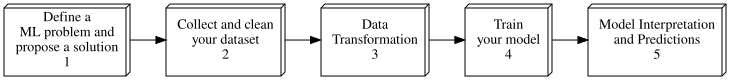

In [ ]:
gv('''ordering=in
problem[shape=box3d width=1 height=1 label="Define a \n ML problem and \n propose a solution\n1"]
dataset[shape=box3d width=1 height=1 label="Collect and clean \n your dataset\n2"]
transform[shape=box3d width=1 height=1 label="Data\n Transformation\n3"]
train[shape=box3d width=1 height=1 label="Train \n your model\n4"]
predict[shape=box3d width=1 height=1 label="Model Interpretation \n and Predictions\n5"]
problem->dataset->transform->train->predict''')

1. *Define a ML problem and propose a solution:* Define the objective of what you want to achieve with your NLP model (in this case we will be focus on Text Generation). Lastly, you need to clearly define your dataset (what text dataset), its source and the model (i.e. text generator) you want to build.

2. *Collect and construct your dataset:* Collect the text dataset that you want to work with and split them into different sets of data (i.e. training set and validation set).

3. *Data Transformation:* Tokenize and numericalise your dataset, create word embeddings and ultimately create the DataLoader.

4. *Train your model:* Train and fine-tune the model on your own dataset to add domain relevant vocab.

5. *Interpret the model and make predictions:* Interpret the model performance using the perplexity metric and use it to generate text.

Let's go through the steps one by one!

# Text Generation in Natural Language Processing

As you have already read above, in order to generate text, we are continously predicting the next word within a given sentence. We do that by training our model with lots and lots of texts, and using the "next" word as the desired output and the previous words as the input. For that, we do not require any predefined labels or classes as the text itself provides all we need, so that the model can train itself (this kind of task is called *self-supervised learning*). By continously predicting the next words in a sequence and comparing it to the actual word that came next, the model trains itself to accurately mimic human language. And that is exactly what we call a Language Model.

> A language model can predict the probability of the next word in the sequence, based on the words already observed in the sequence.

Using a language model, we are able to generate text. But wait... The language is not really writing an essay but rather mimicing the content, structure and writing style on the data it was trained on.

Therefore, its critical to provide domain relevant data for our language model. In other words, if we attempt to generate a fantasy novel, we better provide our model with fantasy books as data. There is one problem with that though. Building a worldclass model takes vast amounts of time, data and resources, that would be beyond a dedicated invidual. This is when we make use of *transfer learning*, which essentially means that we are using a pre-trained model that has already been trained on wide amount of data. On top of that however, we also *fine tuning* the model's parameters with our own data, for it to learn domain relevant vocabulary.

Looking at the visualization below, you can see that we will be using a pretrained model that has been trained on 8 million webpages. This model is widely known as [GPT-2](https://en.wikipedia.org/wiki/GPT-2) created by OpenAI in February 2019. Using that as a foundation, we will use our own data to train the upper layers in the neural network to adjust the model's parameters to our case.

<img src="https://www.dropbox.com/s/umew2yyg2lmxu2z/FineTune.png?dl=1" alt="finetune" width="700"/>

Having understood how we will approach our Text Generation task, let's dive into our use case for this notebook and go through the key steps that have to be done for building any Language Model.

## 1. Define a Machine Learning problem and propose a solution

**Objective:** The objective is to build a Song Lyrics generator that helps us to write the next hit in a few seconds.

**Dataset:** The dataset we will be using consists of Spotify global top 200 tracks during the years 2017–2019.

**Solution:** Our Solution is a Language Model that uses the [GPT-2 model](https://en.wikipedia.org/wiki/GPT-2) (pretrained on a dataset of 8 million web pages) as a foundation, and our dataset above to fine-tune the model and make it more applicable for our use case.

## 2. Collect and construct your dataset


In order to create a dataset for our Language Model, we will be using `Textual` as a tool. Textual helps us to collect the text data we need from a URL or a file to which he define the path to. In this case we will be using `Textual.from_url` in order to construct our dataset. Feel free to see what our dataset looks like via the following [URL](https://raw.githubusercontent.com/deinal/predict-spotify-top-global/master/data/processedlyrics.txt).

By using `Textual` we will automatically:
* Scrape the text data.
* Count the amount of characters that are part of the dataset.
* Create our train & validation set.


In [ ]:
textual = Textual.from_url("https://raw.githubusercontent.com/deinal/predict-spotify-top-global/master/data/processedlyrics.txt")
textual

Text (1609373 chars), textual(),
    train_path, val_path = textual.create_train_val()

Let's have a look at our data. You can utilise the page tool to skim through the different pages.

In [ ]:
textual()

interactive(children=(IntSlider(value=100, description='page', max=200), Output()), _dom_classes=('widget-inte…

## 3. Data Transformations

As we initially defined, a Natural Language Processing model requires certain data pre-processing steps before it can fully start training. The main idea is that the model requires numbers as opposed to text in order to work with the data. However, before simply numericalising the text, it needs to split the text data into different pieces so that it can properly turn the pieces into numbers. The methods to achieve that are commonly knows as  *Tokenization* & *Numericalisation*.

1. **Tokenization:** Tokenization means splitting a text into smaller units, such as individual words or terms. Each of these smaller units are called tokens. Such pre-processing methods is necessary so that we can observe how a word behaves and function across differents texts and contexts. The tokens could be words, numbers or punctuation marks. There are different Tokenization methods such as Word and Sub-word tokenization which we will be discussing. 
2. **Numericalisation:** Make a list of all of the unique words/tokens that appear in the text dataset (jointly also called "the vocab"), and convert each word into a number. This is an operation that is done after Tokenization.

### Tokenization

Let's download a pre-build `tokenizer` that is configured to the GPT-2 model and already comes with a set of rules to handle tokenization on a piece of text. As text can contain various symbols or words, the `tokenizer` has to be able to handle various kinds of text.

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("gpt2")

In order to show how tokenization works, let's use a `sample_txt` that we define below.

In [ ]:
sample_txt = """Fear is the mind-killer.
Fear is the little-death that brings total obliteration.
I will face my fear.
I will permit it to pass over me and through me, and when it has gone past I will turn the inner eye to see its path.
Where the fear has gone there will be nothing.
Only I will remain."""

Below we have applied our downloaded `tokenizer` to the example text. Let's observe how it handles long words, spaces, and symbols.

In [ ]:
tokens = tokenizer.tokenize(sample_txt)
print(tokens)

['Fear', 'Ġis', 'Ġthe', 'Ġmind', '-', 'killer', '.', 'Ċ', 'Fear', 'Ġis', 'Ġthe', 'Ġlittle', '-', 'death', 'Ġthat', 'Ġbrings', 'Ġtotal', 'Ġobliter', 'ation', '.', 'Ċ', 'I', 'Ġwill', 'Ġface', 'Ġmy', 'Ġfear', '.', 'Ċ', 'I', 'Ġwill', 'Ġpermit', 'Ġit', 'Ġto', 'Ġpass', 'Ġover', 'Ġme', 'Ġand', 'Ġthrough', 'Ġme', ',', 'Ġand', 'Ġwhen', 'Ġit', 'Ġhas', 'Ġgone', 'Ġpast', 'ĠI', 'Ġwill', 'Ġturn', 'Ġthe', 'Ġinner', 'Ġeye', 'Ġto', 'Ġsee', 'Ġits', 'Ġpath', '.', 'Ċ', 'Where', 'Ġthe', 'Ġfear', 'Ġhas', 'Ġgone', 'Ġthere', 'Ġwill', 'Ġbe', 'Ġnothing', '.', 'Ċ', 'Only', 'ĠI', 'Ġwill', 'Ġremain', '.']


In the above we can make 4 clear observations:

1. Spaces are represented as **Ġ**. Every words that follows on a space has the **Ġ** attached. 
2. Symbols such as a dash (**-**) or a period (**.**) are its own token.
3. Paragraphs are represented as **Ċ**.
4. Long words are seperated into subwords (i.e. obliteration --> 'Ġobliter', 'ation'). Why that is, we will explain in a bit.

We automatically add each unique token to a huge dictionary, and dedicate a unique number to each unique token.

Utilize the tool below to observe each dedicated number (i.e. ID) for each token.

In [ ]:
@interact
def translate_back_token(token = tokens):
    print(f"Token[{token}] ID: {tokenizer.vocab.get(token)}")

interactive(children=(Dropdown(description='token', options=('Fear', 'Ġis', 'Ġthe', 'Ġmind', '-', 'killer', '.…

Why do we break down longer words into “subword units” like we did above? To further clarify the extend of the Subword Tokenization strategy let's have a look at the word "Adenosine Triphosphate" (= organic compound).

In [ ]:
@interact
def translate_back_token(
    token = tokenizer.tokenize("Adenosine Triphosphate")):
    print(f"Token[{token}] ID: {tokenizer.vocab.get(token)}")

interactive(children=(Dropdown(description='token', options=('Ad', 'enos', 'ine', 'ĠTri', 'ph', 'osph', 'ate')…

You can clearly see that we broke down the two words into 7 unique tokens with their own unique ID.

**Subword Tokenization** is a Tokenization strategy that breaks down long, unknown and in-frequent words into “subword units”. It does that in order to avoid the "vocab" (total list of tokens) being to sparse (too many in-frequent words) and too long. Such strategy allows us to hedge against issues such as misspellings within the dataset or facing entirely new words. That is because a "subword" unit of a new word might hold actual meaning that could be relevant to the model, so that it can properly interpret the new word.

A simple example of that is the word "unfriendly". While "unfriendly" might be a word that is too infrequent, each subword unit holds some kind of meaning. "**un**" (something not: un-healthy, un-likely etc.), **friend** (a friend), **ly** (often used with adjectives).

This is to show you, how already now we are considering how to keep the meaning of the words and sub-words. Feel free to the change the word in the code-cell to see how different words are tokenized.

<img src="https://www.dropbox.com/s/upd6t7nm1sjcolw/Subword.png?dl=1" alt="finetune" width="700"/>

We can decode every single token ID that is part of our vocab it back to the corresponding word and sub-word.

In [ ]:
tokenizer.decode(37798)

'Fear'

Like we have seen above, every token has its own Token ID. Let's combine Tokenization & Numericalisation in one step to directly look at the list of Token IDs with `tokenizer.encode`. You can also compare here what TokenID corresponds to what Token.

In [ ]:
tokenized = tokenizer.encode(sample_txt)
print(tokenized)

[37798, 318, 262, 2000, 12, 32156, 13, 198, 37798, 318, 262, 1310, 12, 22595, 326, 6774, 2472, 35722, 341, 13, 198, 40, 481, 1986, 616, 3252, 13, 198, 40, 481, 8749, 340, 284, 1208, 625, 502, 290, 832, 502, 11, 290, 618, 340, 468, 3750, 1613, 314, 481, 1210, 262, 8434, 4151, 284, 766, 663, 3108, 13, 198, 8496, 262, 3252, 468, 3750, 612, 481, 307, 2147, 13, 198, 10049, 314, 481, 3520, 13]


Let's decode the entire `sample_txt` (turn numericalised tokens into corresponding text).

In [ ]:
print(tokenizer.decode(tokenized))

Fear is the mind-killer.
Fear is the little-death that brings total obliteration.
I will face my fear.
I will permit it to pass over me and through me, and when it has gone past I will turn the inner eye to see its path.
Where the fear has gone there will be nothing.
Only I will remain.


Since we are using the tokenizer of the GPT-2 model that you have learned about before its vocab size is huge (50257 tokens), as it contains the vocabs of 8 million web pages.

In [ ]:
tokenizer.vocab_size

50257

Let's have a look at a tokenized batch of our Song Lyrics Dataset.

In [ ]:
textual.show_batch(tokenizer)

/usr/local/lib/python3.7/dist-packages/transformers/data/datasets/language_modeling.py:58: FutureWarning: This dataset will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/master/examples/pytorch/language-modeling/run_mlm.py
  FutureWarning,
DEBUG:filelock:Attempting to acquire lock 140382634901136 on ./cached_lm_GPT2TokenizerFast_128_train_text.txt.lock
DEBUG:filelock:Lock 140382634901136 acquired on ./cached_lm_GPT2TokenizerFast_128_train_text.txt.lock
Token indices sequence length is longer than the specified maximum sequence length for this model (357373 > 1024). Running this sequence through the model will result in indexing errors
DEBUG:filelock:Attempting to release lock 140382634901136 on ./cached_lm_GPT2TokenizerFast_128_train_text.txt.lock
DEBUG:filelock:Lock 140382634901136 released on ./cached_lm_GPT2TokenizerFast_128_train

{'input_ids': tensor([[   65,    11,  5194,    11,  5194,   679,   588,   326,  1842,    11,
           1842,    11,  1842,   314,  1101,   588,   326,  2563,    11,  2563,
             11,  2563,   679,  5296,   618,   339,   319,   340,   357,  2202,
            340,   828,   530,  6938,   290,   339,   765,   340,   357,  3198,
           6938,   290,   339,   765,   340,     8,   679,   588,   326, 20188,
             11, 20188,    11, 20188,    11,   357,  1544,   588,   326, 20188,
              8,   679,   588,   326,  5194,    11,  5194,    11,  5194,    11,
            357,  1544,   588,   326,  5194,     8,   679,   588,   326,  1842,
             11,  1842,    11,  1842,    11,   357,  1544,   588,   326,  1842,
              8,   314,   285,   588,   326,  2563,    11,  2563,    11,  2563,
             11,   357,    40,  1101,   588,   326,  2563,     8,   679,  5296,
            618,   339,   319,   340,   357,  2202,   340,   828,   530,  6938,
            290,   339,   7

## 4. Model Training

After tokenizing and numericalising our dataset, we can finally fine-tune our model. However, before we can do that we need to download the pretrained model we will be using.

> Let's briefly review again why using pretrained models is so powerful: By using the pretrained GPT-2 model, we are able to make use of the resources provided by some of the most powerful AI organizations in the world. Since it requires a lot of time and money to train such a powerful model, we can simply make use of the finished model with its already trained weights. Therefore, we simply fine-tune the pretrained model to update the weights that are relevant to us.

In [ ]:
pretrained_model = pipeline("text-generation", model='gpt2')

The pre-trained model that we are now using also contains its own tokenizer (it's the same that we have a learned about above). We can observe the type of both the model (GPT2 Language Model) and tokenizer (GPT 2 Tokenizer) below.

In [ ]:
type(pretrained_model.model), type(pretrained_model.tokenizer)

(transformers.models.gpt2.modeling_gpt2.GPT2LMHeadModel,
 transformers.models.gpt2.tokenization_gpt2_fast.GPT2TokenizerFast)

Ahead of training our model, we also need to set on our amount of epochs via `num_train_epochs` and our batch size (approx. amount of sentences to be processes before parameters are updated) via `per_device_train_batch_size` and `per_device_eval_batch_size`. Do not worry about the batch size for now.

Also pay attention to `"./write_style"` which is the output directory/folder of our fine-tuned model. After the training, the fine-tuned model will be saved for further use.

In [ ]:
arguments = TrainingArguments(
    output_dir="./write_style",
    overwrite_output_dir=True,  
    num_train_epochs=3,
    per_device_train_batch_size=24,
    per_device_eval_batch_size=64,
    )

Let's now build our trainer by defining our **model**, **tokenizer** and **training arguments** that we all defined before.

In [ ]:
trainer = textual.get_hf_trainer(
    model=pretrained_model.model,
    tokenizer = pretrained_model.tokenizer,
    arguments = arguments
    )

/usr/local/lib/python3.7/dist-packages/transformers/data/datasets/language_modeling.py:58: FutureWarning: This dataset will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/master/examples/pytorch/language-modeling/run_mlm.py
  FutureWarning,
DEBUG:filelock:Attempting to acquire lock 140382628831312 on ./cached_lm_GPT2TokenizerFast_128_train_text.txt.lock
DEBUG:filelock:Lock 140382628831312 acquired on ./cached_lm_GPT2TokenizerFast_128_train_text.txt.lock
DEBUG:filelock:Attempting to release lock 140382628831312 on ./cached_lm_GPT2TokenizerFast_128_train_text.txt.lock
DEBUG:filelock:Lock 140382628831312 released on ./cached_lm_GPT2TokenizerFast_128_train_text.txt.lock
DEBUG:filelock:Attempting to acquire lock 140382628940176 on ./cached_lm_GPT2TokenizerFast_128_val_text.txt.lock
DEBUG:filelock:Lock 140382628940176 acquired on ./cached_l

After doing all that let's finally fine-tune our model. Now the model will process our dataset, do the tokenization and numericalisation before it starts learning. Be prepared. It will take longer than what you are usually used to. 

In [ ]:
trainer.train()

***** Running training *****
  Num examples = 2791
  Num Epochs = 3
  Instantaneous batch size per device = 24
  Total train batch size (w. parallel, distributed & accumulation) = 24
  Gradient Accumulation steps = 1
  Total optimization steps = 351


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=351, training_loss=3.2738012764868234, metrics={'train_runtime': 563.6939, 'train_samples_per_second': 14.854, 'train_steps_per_second': 0.623, 'total_flos': 546949545984000.0, 'train_loss': 3.2738012764868234, 'epoch': 3.0})

Save the model in the `"./write_style"` directory for further use.

In [ ]:
trainer.save_model()

Saving model checkpoint to ./write_style
Configuration saved in ./write_style/config.json
Model weights saved in ./write_style/pytorch_model.bin


## 5. Interpret the model and make predictions

Let's finally try out our fine-tuned text generation Language Model by inserting the `'./write_style'` directory as our `model`, to assist us with generating the song lyrics for our next hit.

In [ ]:
style_writer = pipeline('text-generation',
                        model='./write_style',
                        tokenizer=pretrained_model.tokenizer
                        )

Please provide the beginning of your song text and feel free play with the parameters below.

In [ ]:
style_writer("This is the time",
            max_length=50,
            num_return_sequences=1)

Using pad_token, but it is not set yet.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


[{'generated_text': "This is the time! (Ahh) Don't play your heart and laugh (Woah) Fuck the game You want me more, more, more (Ahh) I want you more, more, more (Ahh) I want you"}]

What do you think about the results?

After changing the input a couple of times, what similarities can you see between the outputs?

How do the results represent modern song lyrics?

### How is the model able to comprehend language?

After having created our own fine-tuned text generation language model, we again try to understand how the model is able to train itself and comprehend language.

Surprisingly, just like a recommender system utilizes embeddings to find patterns and relationships between items, we utilize the same technique to find meaning and relationships between words. Let's dive further into what word-embeddings represent is the case of NLP.

**Word Embeddings:** After processing the numericalised text data, the model creates an embedding for each word. A word embedding is a learned representation for text where words that have the same meaning have a similar representation.

To better understand this, let's think of the model we are working with. We are using the GPT-2, that has already been pretrained on 8 million web pages. Thus, it already has learned embeddings and a defined amount of tokens.  Let's look at how many we are working with by observing the shape of our word embeddings of the GPT-2 Model.

In [ ]:
embedding_vecs = style_writer.model.transformer.wte.weight.detach().cpu().numpy()
embedding_vecs.shape

(50257, 768)

The GPT-2 Model has a vocab of 50k+ tokens, each with 768 learned features (also called *latent factors* in recommender systems). One token along with its learned feature is what we call a word-embedding.

To better understand what this means, let's have a look at the visualization below. Every token is defined by its learned features (in our case 768 features). The value of such features is being learned during the model training and is based on the underlying dataset.

One of those 768 features could each represent a "meaning" such as illustrated in the image below (i.e. "living being", "human" etc.). Try to look into the numbers below to find a pattern. We can observe a few things (observe the image yourself first before reading through below):

> *Word-Embeddings (Car, Kitten, Dog, Houses):*
* Cat, Kitten and Dog all score relatively high on the living being features as opposed to Houses.
* Houses scores high on the plural feature.
* After reducing dimensions from 7D (in our case this would be 768D) down to 2D, we can also visualize the "meaning relationship" of these word embeddings. Cat and Kitten are very close together as their meaning is also very similar.

> *Word-Embeddings (Man, Woman, King, Queen):*
* Man and King score relatively high on the gender feature while Womand and Queen a lot lower. This is because the gender features represents everything male as closer to 1 and everything female close to -1.
* King and Queen score high on the royalty features.
* After reducing dimensions from 7D (in our case this would be 768D) down to 2D, we can also visualize the "meaning relationship" of these word embeddings. Man and woman are in a similar "meaning relationship" such as  King and Queen.


<img src="https://www.dropbox.com/s/wtzez4pk9auygrt/wordembeddings1.png?dl=1" alt="wordembeddings" width="700"/>

The more embeddings we are working with, the more powerful this becomes. As you can see below, the possible amount of "meaning relationships" between word-embeddings, is endless. This allows for a wide-range of applications. Imagine being able to find the most similar documents in your database by looking at their word-embeddings and their distances.

<img src="https://www.dropbox.com/s/fv1vgfhwwwdnbsv/wordembeddings2.jpg?dl=1" alt="wordembeddings" width="700"/>

Let's have a look at such embeddings for our dataset.

### Model & Word-Embedding Interpretation

For the below, we will be using the `InterpEmbeddingsTokenizer` in order to give us some sense on the "meaning relationships" and the embedding distance like we have looked at above.

In [ ]:
interp = InterpEmbeddingsTokenizer(embedding_vecs, pretrained_model.tokenizer)

With this we can try to find the closest word-embeddings to the input words. You can see that number 1, 2 and 3 are exactly the input words. On top of that, it is surprising how "similar" the input words are to the opposite meaning hatred. 

> *Similarity:* Text Similarity is used to find the closeness between two word-embeddings of text by performing calculatios on the learned features.

In [ ]:
interp.search("love affection passion")

,tokens,idx,similarity
0,love,23205,0.268628
1,Ġaffection,17696,0.263002
2,Ġpassion,7506,0.258686
3,Ġlove,1842,0.242725
4,Love,18565,0.232339
5,ĠLOVE,27889,0.216723
6,Ġloves,10408,0.210462
7,Ġenthusiasm,17131,0.209531
8,Ġdevotion,25808,0.208173
9,Ġpassions,30477,0.207256


Let's visualize our embedding space by using the Embedding Projector in TensorBoard.

With the code below, we specify to observe the first 500 embeddings of tokens that are longer than 4 characters. That will make it easier to interpret.

In [ ]:
tokens = [k for k in Counter(pretrained_model.tokenizer.tokenize(textual.text))
          if len(str(k))>4]
token_ids = pretrained_model.tokenizer.convert_tokens_to_ids(tokens)

Token indices sequence length is longer than the specified maximum sequence length for this model (445393 > 1024). Running this sequence through the model will result in indexing errors


In [ ]:
interp.visualize_in_tb(selection = token_ids)

Please run the the following command in a cell
%load_ext tensorboard
%tensorboard  --logdir ./logs


After running the last code cell below, please follow the step-by-step guide below:

1. You will initially see a dark error page. After several seconds, you will be able to see a page, on which you can click the little arrow / triangle next to `INACTIVE` to open a "drop-down menu" (a list of choices).
2. Scroll down on the menu that appeared up and select the `PROJECTOR` option (see screenshot below).
3. After choosing the `PROJECTOR` as an option, please select `T-SNE` (t-distributed stochastic neighbor embedding) on the bottom left (see picture). This will reduce dimensions from 768D down to 3D or 2D, and show us the most similar embeddings in a 3D or 2D space.
4. After clicking `T-SNE` the operation will automatically go through many iterations (you can use the default settings). We paused at a 5580 iterations, but feel free to process for more.

<img src="https://www.dropbox.com/s/tb5bidt0je5nwm9/TensorBoard.png?dl=1" alt="TensorBoard" width="800"/>

*The below serves as an additional tool of visualizing the embeddings space. We do not expect you to understand all the terms that can be seen in the dashboard, however we expect you to explore the different embeddings.*

In [ ]:
%reload_ext tensorboard
%tensorboard  --logdir ./logs

Reusing TensorBoard on port 6006 (pid 171), started 1:02:35 ago. (Use '!kill 171' to kill it.)

<IPython.core.display.Javascript object>

You can find an example of what insights you could be able to extract from the TensorBoard.

<img src="https://www.dropbox.com/s/7tsaus2seo3pek2/TensorBoardEx.png?dl=1" alt="TensorBoard" width="1000"/>

# Your Deliverables, your time to apply the theory in practice.

Congratulations on getting to the end of this Notebook and no worries at all if you struggled with some of the theory and did not fully understand what was taught here as your actual learning starts from here.

The ideal time of reading this, is right before the Review Session, so you have a bit of time to reflect about the learning material, identify the most confusing and hard elements of a reading, and bring them to the discussion at Q&A Session with Mentor and TA. The Review Session is thus for you to close the gap in your current understanding of the material.

For your deliverables you will have to work on a separate Workbook.

**Sources**:

* https://machinelearningmastery.com/what-are-word-embeddings/
* https://towardsdatascience.com/the-beginners-guide-to-language-models-aa47165b57f9
* https://machinelearningmastery.com/statistical-language-modeling-and-neural-language-models/
* https://www.thoughtvector.io/blog/subword-tokenization/
* [🤗huggingface](https://huggingface.co/), is another machine learning library. Its founder created this library to have people share their pretrained NLP model to save eletricity accross the world.